In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.utils import save_image

# Set random seed for reproducibility
SEED = 40
torch.manual_seed(SEED)
np.random.seed(SEED)

# Hyperparameters
NOISE_DIM = 100
BATCH_SIZE = 32
STEPS_PER_EPOCH = 500
EPOCHS = 10
WIDTH, HEIGHT, CHANNELS = 256, 256, 1
lr = 0.0002
beta1 = 0.5

MAIN_DIR = "brain_tumor_dataset/yes"

def load_images(folder):
    imgs = []
    target = 1
    labels = []
    for i in os.listdir(folder):
        img_dir = os.path.join(folder, i)
        try:
            img = cv2.imread(img_dir)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (WIDTH, HEIGHT))
            imgs.append(img)
            labels.append(target)
        except Exception as e:
            print(f"Error loading image {img_dir}: {e}")
    
    imgs = np.array(imgs)
    labels = np.array(labels)
    
    return imgs, labels

data, labels = load_images(MAIN_DIR)
print(f"Data shape before normalization: {data.shape}")

# Display a few sample images to verify the reading process
for i in range(5):
    plt.imshow(data[i], cmap='gray')
    plt.title(f"Sample image {i}")
    plt.show()

data = (data.astype(np.float32) - 127.5) / 127.5  
data = data.reshape(-1, CHANNELS, HEIGHT, WIDTH)  
data = torch.tensor(data, dtype=torch.float32)
print(f"Data shape after normalization: {data.shape}")

Data shape before normalization: (155, 256, 256)


In [2]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(NOISE_DIM, 256 * 32 * 32),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Unflatten(1, (256, 32, 32)),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), 
            nn.LeakyReLU(0.2, inplace=True),                     
            nn.Conv2d(64, CHANNELS, 3, padding=1),              
            nn.Tanh()
        )
    
    def forward(self, x):
        return self.model(x)


In [3]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(CHANNELS, 64, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Flatten(),
            nn.Dropout(0.4),
            nn.Linear(256 * 32 * 32, 1),  
            nn.Sigmoid()
        )
    
    def forward(self, x):
        return self.model(x)

In [4]:
# Inisialisasi models, optimizers, dan criterion
generator = Generator()
discriminator = Discriminator()
optimizer_G = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))
criterion = nn.BCELoss()

In [23]:
from torchvision.utils import make_grid
def sample_images(epoch, nrow=10, save=True):
    generator.eval()  
    with torch.no_grad():
        noise = torch.randn(nrow**2, NOISE_DIM)
        gen_imgs = generator(noise).cpu()
    generator.train()  

    grid = make_grid(gen_imgs, nrow=nrow, normalize=True, value_range=(-1, 1))
    
    if save:
        save_image(grid, f"brain/epoch_{epoch}.png")
    
    plt.figure(figsize=(15, 15))
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis('off')
    plt.show()


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:30:05<00:00, 10.81s/it]


EPOCH: 1 Generator Loss: 3.3296 Discriminator Loss: 0.4063


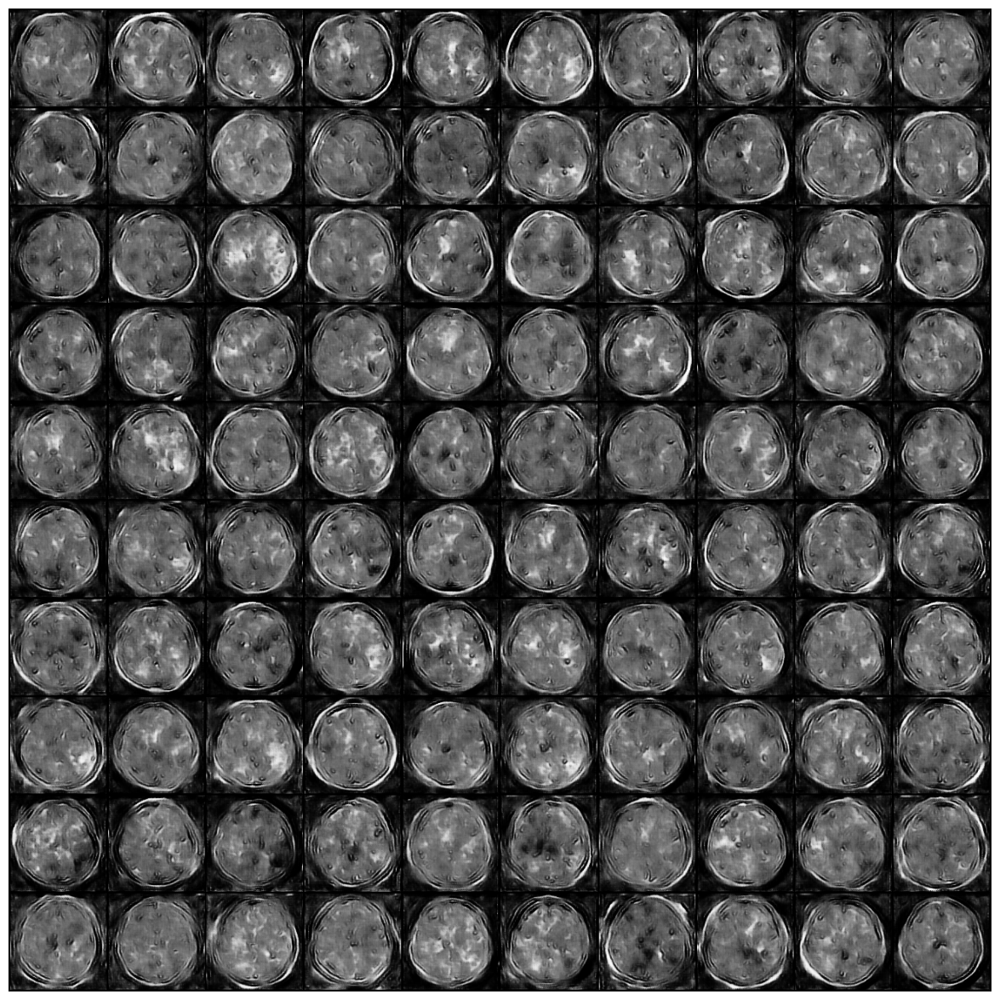

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:30:30<00:00, 10.86s/it]


EPOCH: 2 Generator Loss: 2.9284 Discriminator Loss: 0.4464


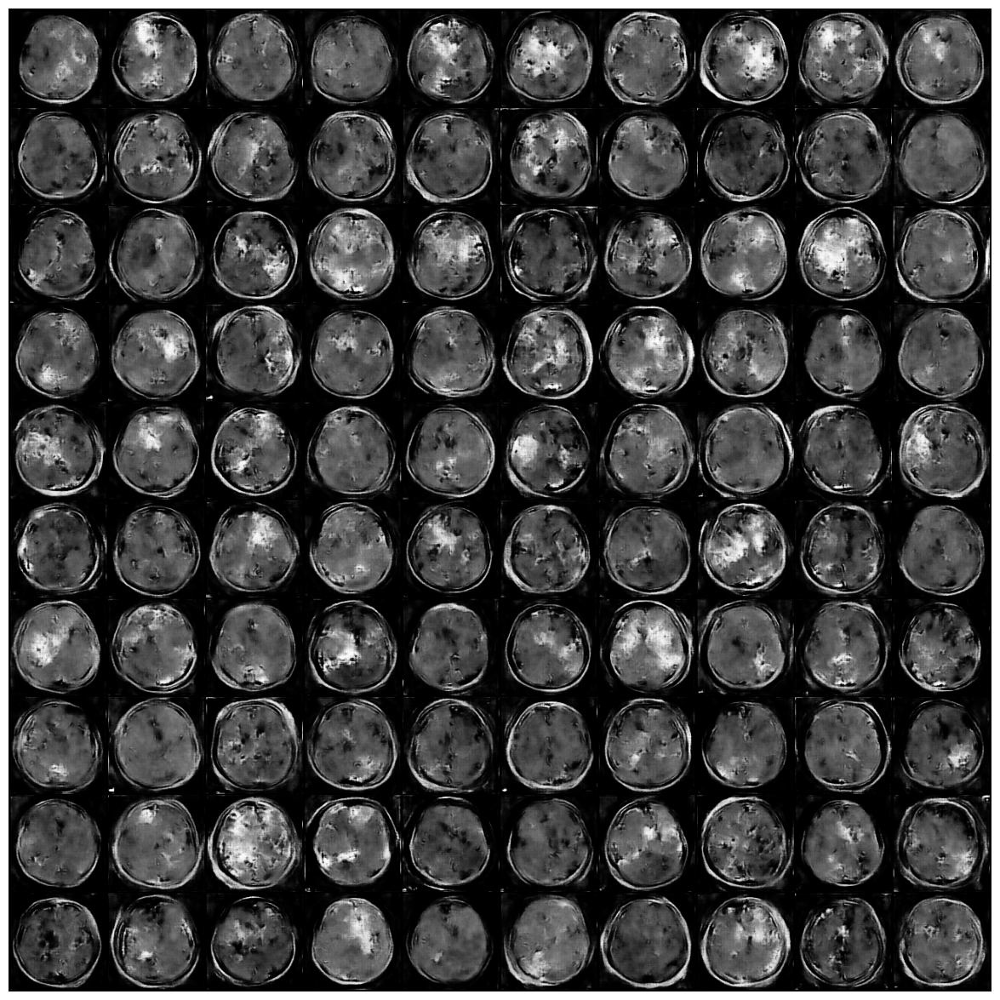

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:30:40<00:00, 10.88s/it]


EPOCH: 3 Generator Loss: 2.9811 Discriminator Loss: 0.4168


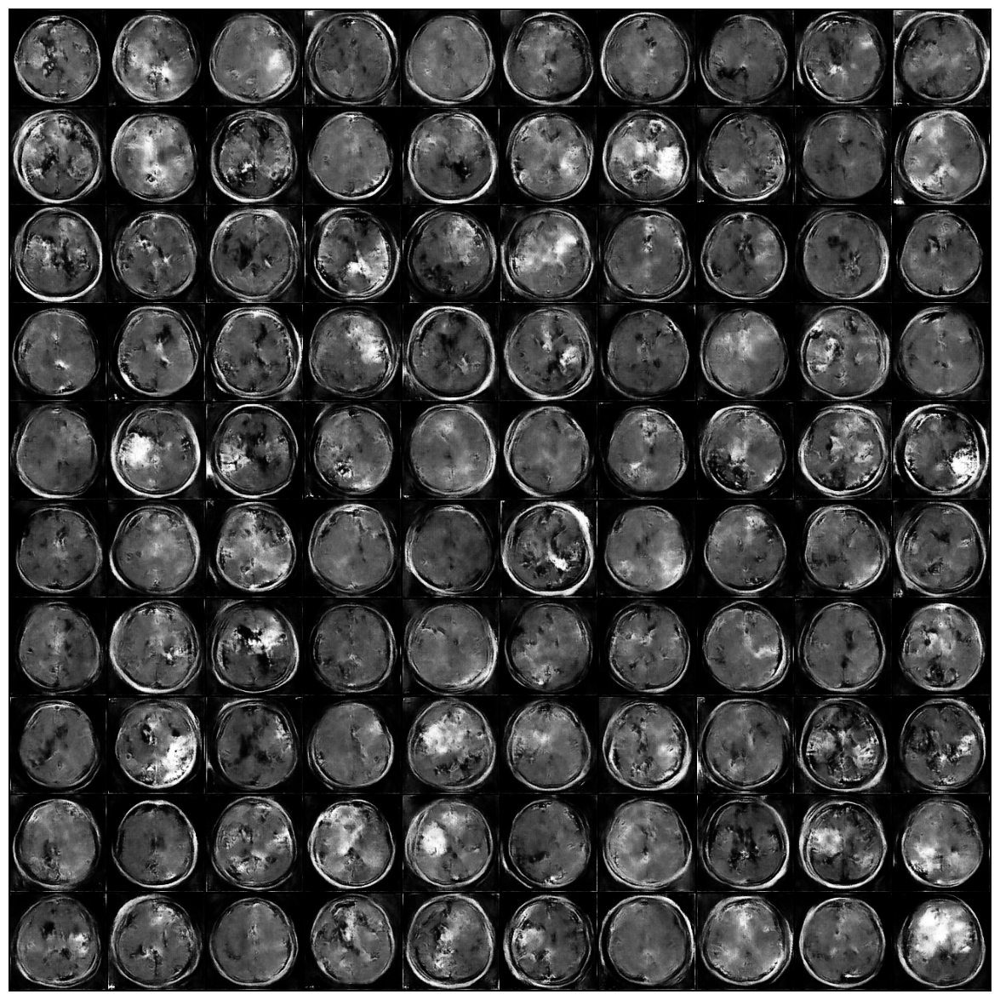

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:30:32<00:00, 10.86s/it]


EPOCH: 4 Generator Loss: 3.1997 Discriminator Loss: 0.3406


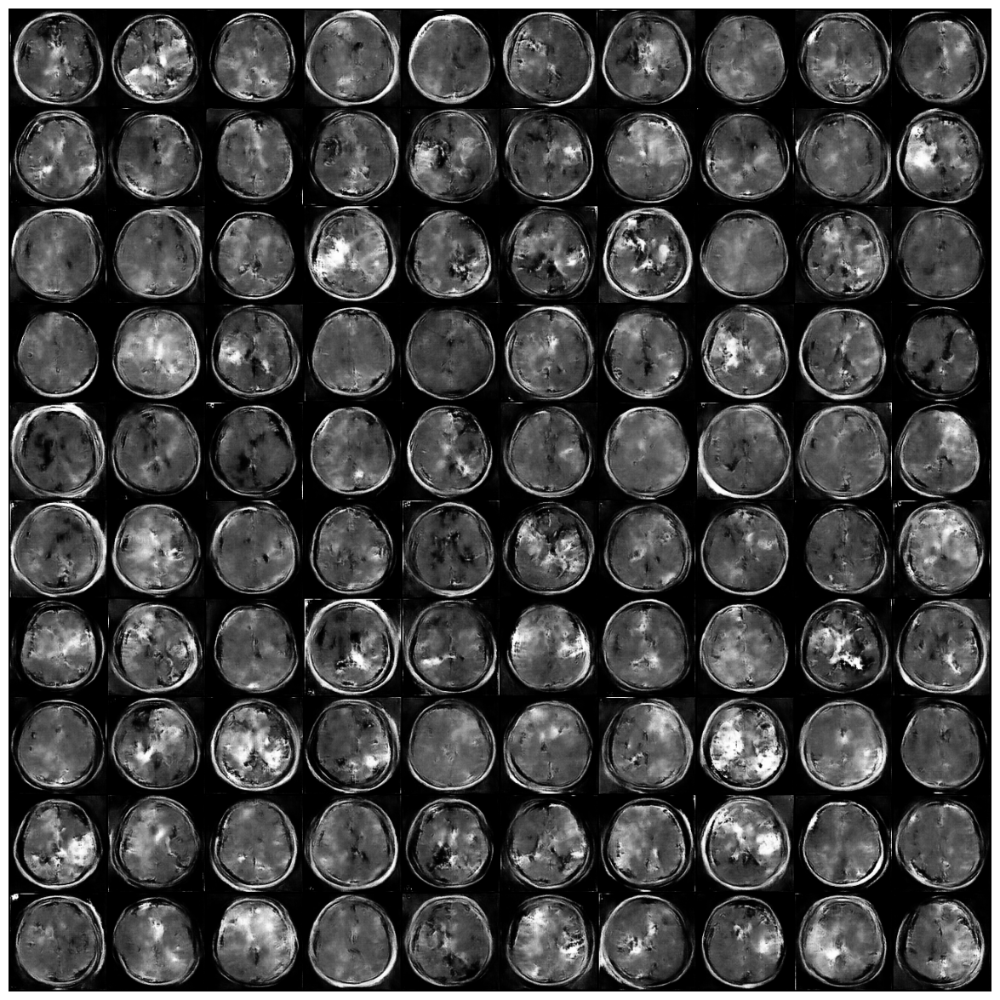

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:31:30<00:00, 10.98s/it]


EPOCH: 5 Generator Loss: 3.4647 Discriminator Loss: 0.2845


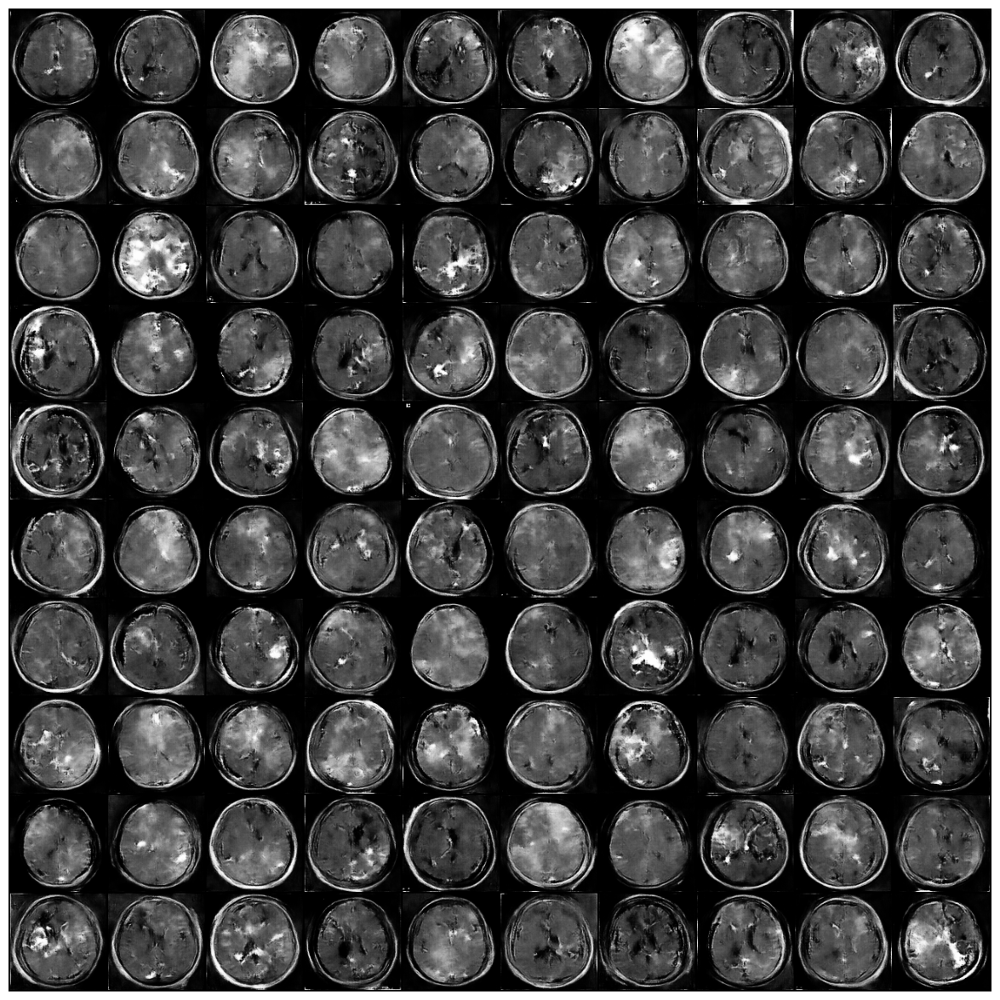

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:28:46<00:00, 10.65s/it]


EPOCH: 6 Generator Loss: 3.7532 Discriminator Loss: 0.2522


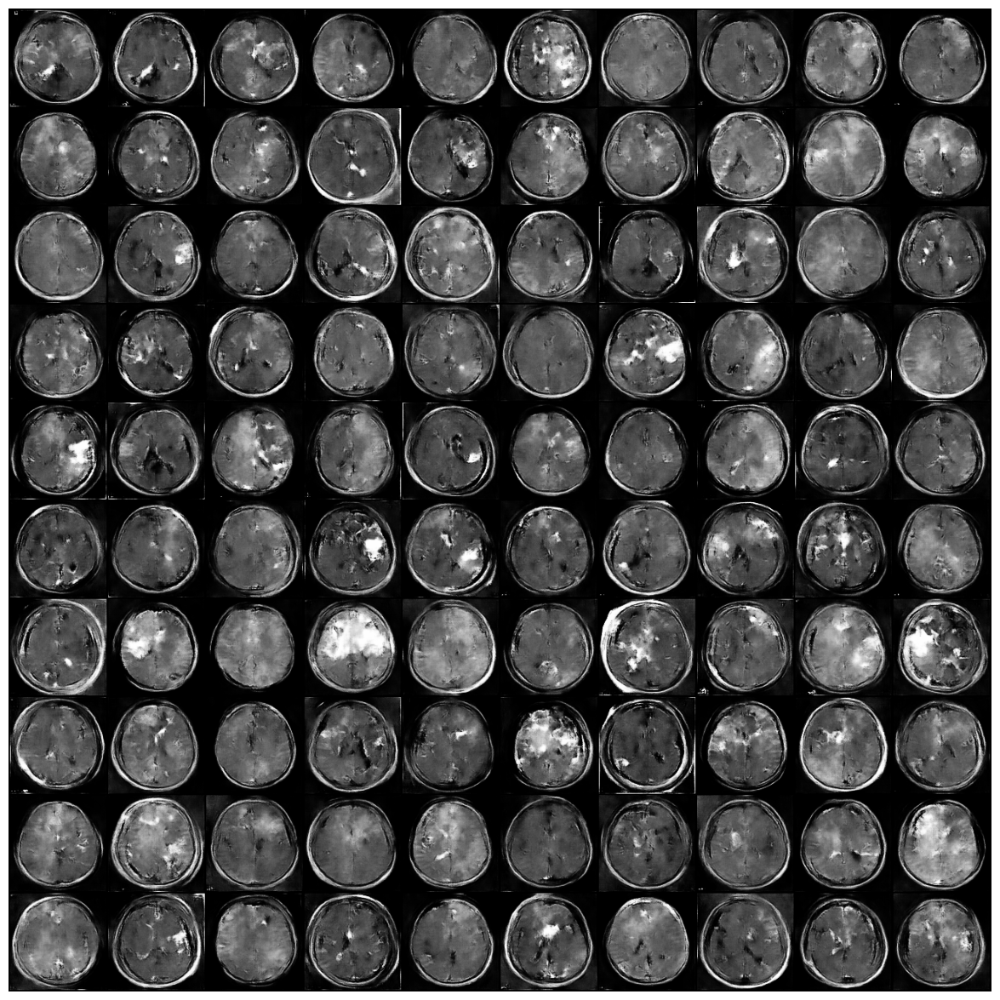

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:14:18<00:00,  8.92s/it]


EPOCH: 7 Generator Loss: 4.1070 Discriminator Loss: 0.2333


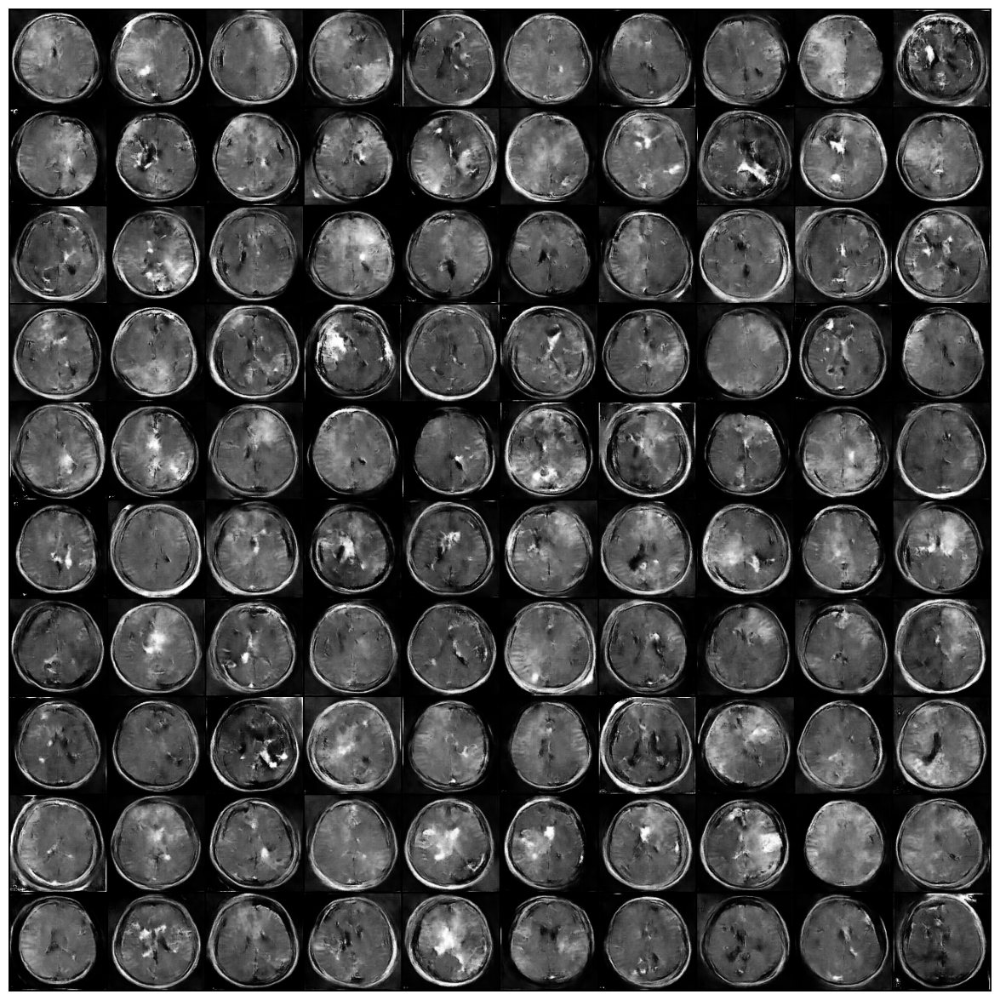

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:14:43<00:00,  8.97s/it]


EPOCH: 8 Generator Loss: 4.3985 Discriminator Loss: 0.2052


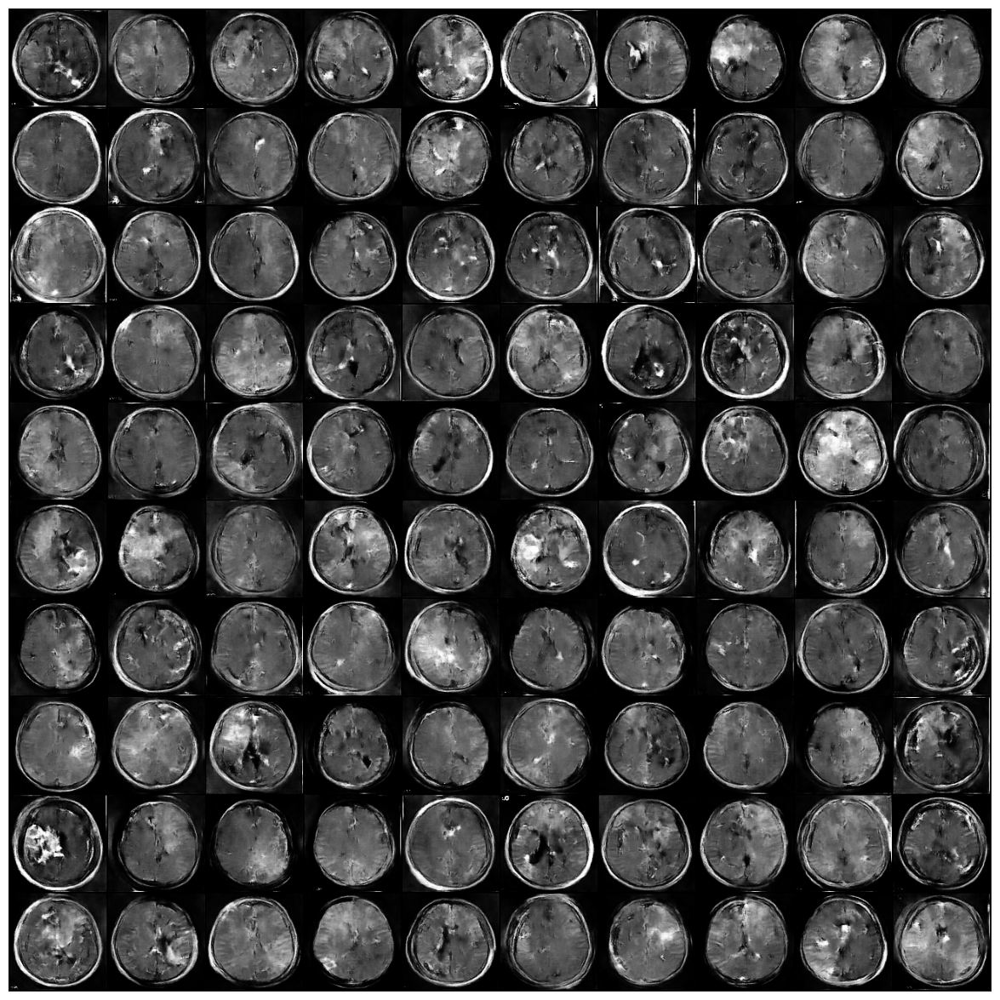

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:16:25<00:00,  9.17s/it]


EPOCH: 9 Generator Loss: 4.6936 Discriminator Loss: 0.1596


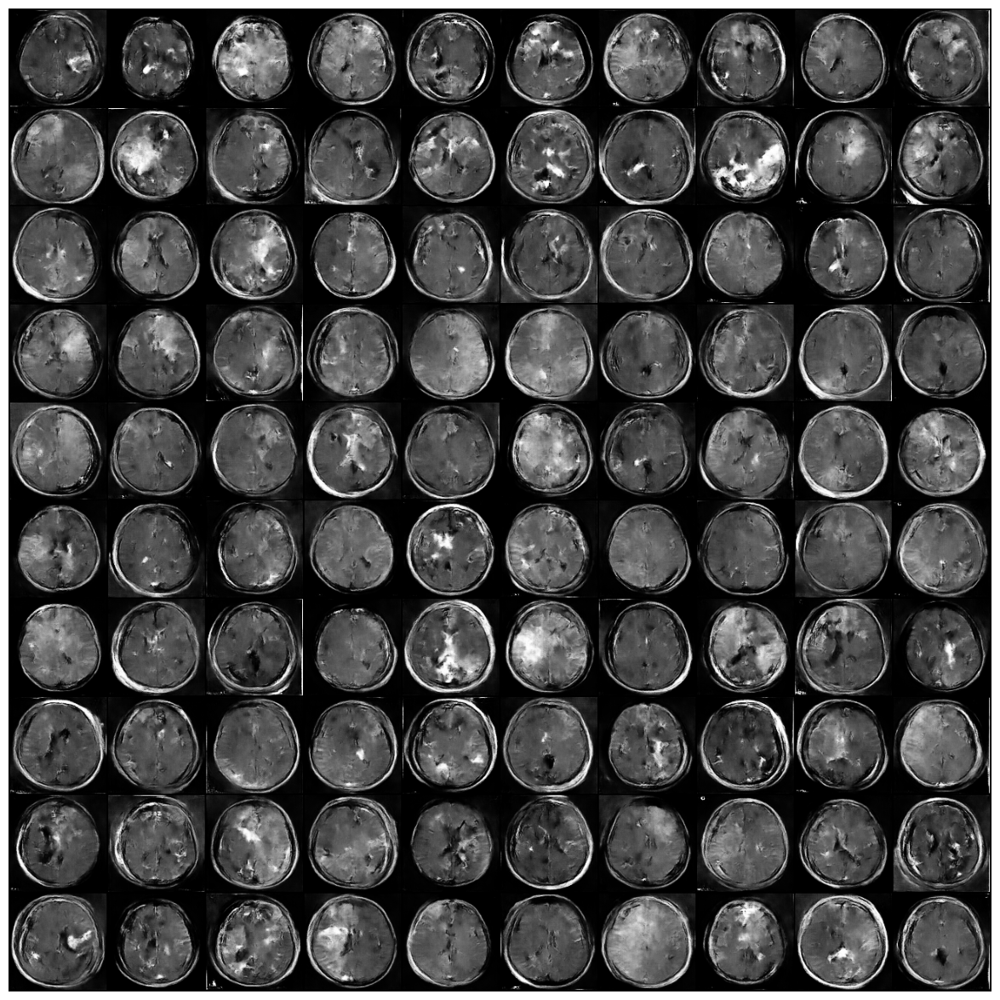

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [1:18:10<00:00,  9.38s/it]


EPOCH: 10 Generator Loss: 4.7893 Discriminator Loss: 0.3746


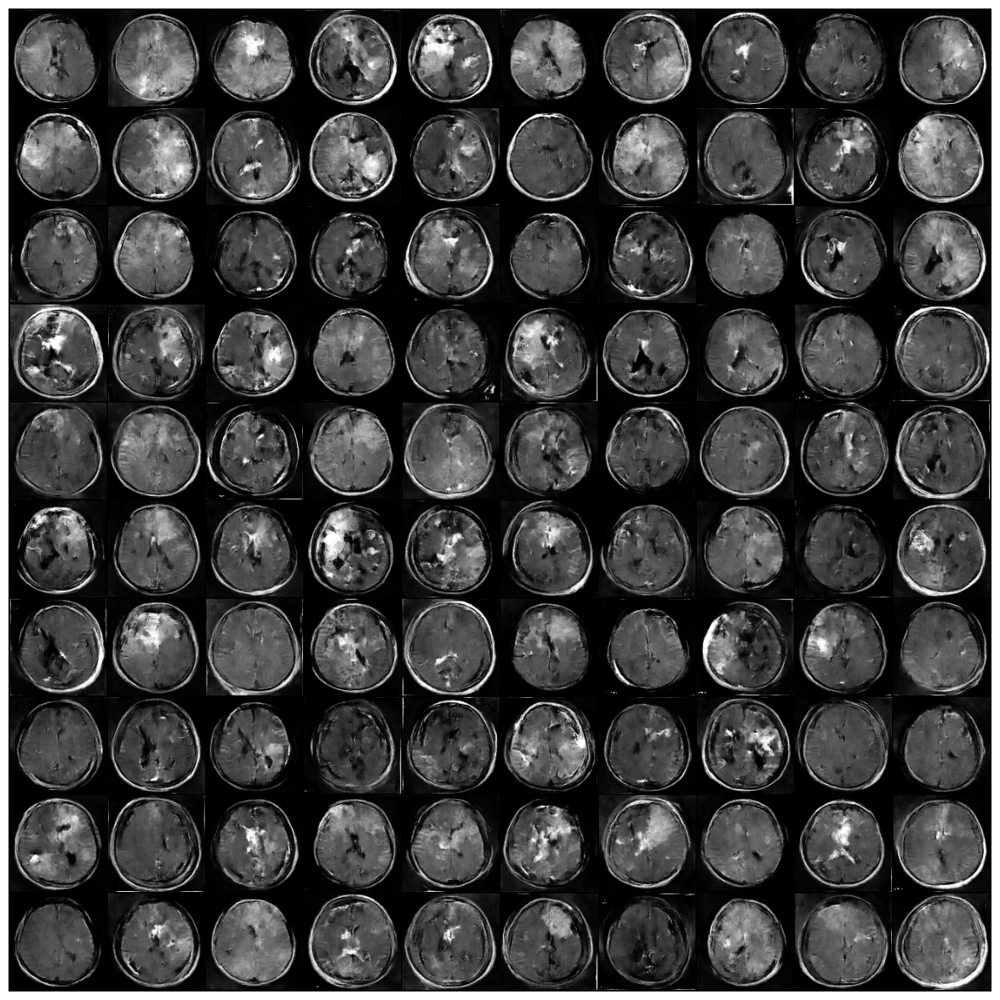

In [8]:
for epoch in range(EPOCHS):
    g_loss_epoch = 0
    d_loss_epoch = 0

    for i in tqdm(range(STEPS_PER_EPOCH)):
        # Train Discriminator
        optimizer_D.zero_grad()
        noise = torch.randn(BATCH_SIZE, NOISE_DIM)
        fake_X = generator(noise)
        idx = torch.randint(0, data.size(0), (BATCH_SIZE,))
        real_X = data[idx]
        if real_X.size() != fake_X.size():
            continue
        real_preds = discriminator(real_X)
        fake_preds = discriminator(fake_X.detach())
        d_loss = criterion(real_preds, torch.ones_like(real_preds)) + criterion(fake_preds, torch.zeros_like(fake_preds))
        d_loss.backward()
        optimizer_D.step()
        d_loss_epoch += d_loss.item()

        # Train generator
        optimizer_G.zero_grad()
        fake_X = generator(noise)
        fake_preds = discriminator(fake_X)
        g_loss = criterion(fake_preds, torch.ones_like(fake_preds))
        g_loss.backward()
        optimizer_G.step()
        g_loss_epoch += g_loss.item()

    print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss_epoch / STEPS_PER_EPOCH:.4f} Discriminator Loss: {d_loss_epoch / STEPS_PER_EPOCH:.4f}")

    sample_images(epoch, nrow=10, save=True)